In [1]:
from torch import nn
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from Sources.ViT.models.modeling import VisionTransformer, CONFIGS
from Sources.data_tools import ImageDataset
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
from torchvision.io import read_image
import csv
import random
import torchvision
from tqdm.notebook import tqdm_notebook
import torchvision.models as models
from Sources.vit_rollout import VITAttentionRollout
from Sources.pytorch_grad_cam_master.pytorch_grad_cam import GradCAM
from Sources.pytorch_grad_cam_master.pytorch_grad_cam.utils.image import show_cam_on_image
from Sources.pytorch_grad_cam_master.pytorch_grad_cam import AblationCAM

In [2]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Using {} device'.format(device))

labels_map = {
    "Benign": 0,
    "InSitu": 1,
    "Invasive": 2,
}

Using cuda device


In [3]:
# Prepare Model
config = CONFIGS["ViT-B_16"]
model = VisionTransformer(config, num_classes=1000, zero_head=False, img_size=224, vis=True)
model.head = nn.Linear(768, 3)
model.load_state_dict(torch.load("../Logits/SavedNN/Saved_ViT/" + str(150)))
model.eval()
None

Feature batch shape: torch.Size([1, 3, 224, 224])
Labels batch shape: 1
torch.Size([224, 224, 3])


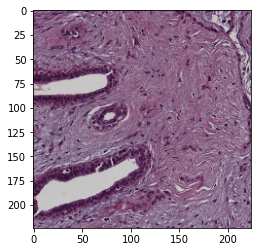

Label: 0


In [4]:
transform_for_maps = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])
dataset = ImageDataset('../Data/burnasyan_Br.csv', 'val_paths.txt', transform = transform_for_maps)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True)
features, labels = next(iter(dataloader))
print(f"Feature batch shape: {features.size()}")
print(f"Labels batch shape: {len(labels)}")
img = features[0].squeeze().permute(1, 2, 0).int()
print(img.shape)
label = labels[0]
plt.imshow(img)
plt.show()
print(f"Label: {label}")

In [5]:
transform = transforms.Compose([
#     transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])

im = features[0]
x = transform(im / 255)
x.size()

torch.Size([3, 224, 224])

In [6]:
with torch.no_grad():
    rollout = VITAttentionRollout(model, discard_ratio=0.9, head_fusion='max')
    mask = rollout(features)

In [7]:
mask = mask / np.max(mask)

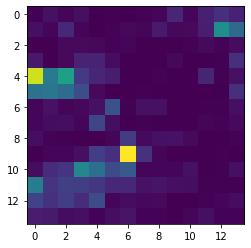

In [8]:
plt.imshow(mask)
plt.show()

In [9]:
image = features.cpu().detach() / 255
image = image.squeeze().permute(1, 2, 0).numpy()
mask = cv2.resize(mask, (224, 224))[..., np.newaxis]
res = show_cam_on_image(image, mask, use_rgb=True)

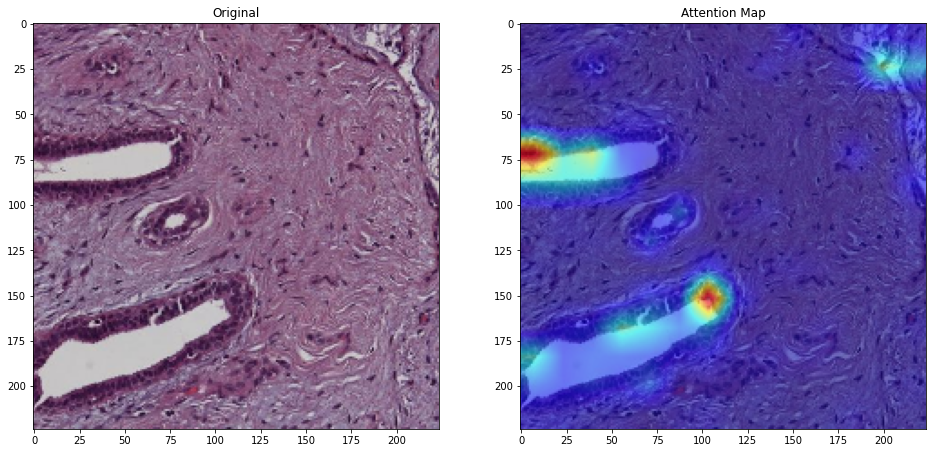

In [10]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Attention Map')
_ = ax1.imshow(img)
_ = ax2.imshow(res)

In [11]:
input_tensor = features
with torch.no_grad():
    pred_probs = model(input_tensor)[0]
#     print(pred_probs)
    pred_probs = nn.Softmax(dim=1)(pred_probs)

pred_label = np.argmax(pred_probs.cpu().detach().numpy(), axis = 1)
print(pred_label)

[0]


In [12]:
print(pred_label[0])

0


## ResNet50

In [12]:
net = models.resnet50(pretrained=False)
net.fc = nn.Linear(2048, 3)
net.load_state_dict(torch.load("../Logits/SavedNN/Saved_ResNet/" + str(50)))
net.eval()
None

In [13]:
input_tensor = features
with torch.no_grad():
    pred_probs = net(input_tensor)
    pred_probs = nn.Softmax(dim=1)(pred_probs)

pred_label = np.argmax(pred_probs.cpu().detach().numpy(), axis = 1)
print(pred_label[0])

2


In [14]:
print(net.layer4[-1])

Bottleneck(
  (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
)


In [15]:
class GradCamDebug(GradCAM):
    
    def get_cam_weights(self,
                        input_tensor,
                        target_layer,
                        target_category,
                        activations,
                        grads):
        print(np.mean(grads, axis=(2, 3)).shape)
        return np.mean(grads, axis=(2, 3))

In [16]:
target_layers = [net.layer4[-1]]

# target_layers = []
# for layer in [net.layer1, net.layer2, net.layer3,net.layer4]:
#     for i in range(3):
#         target_layers.append(layer[i])

# Construct the CAM object once, and then re-use it on many images:
cam = GradCAM(model=net, target_layers=target_layers)

target_category = label.item()

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)

# In this example grayscale_cam has only one image in the batch:
grayscale_cam = grayscale_cam[0, :]

Grad output from activations and gradients:
tensor([-0.0049, -0.0044, -0.0038,  ...,  0.0033,  0.0033,  0.0035])


In [17]:
print(grayscale_cam.shape)

(224, 224)


In [18]:
image = features.cpu().detach() / 255
image = image.squeeze().permute(1, 2, 0).numpy()

In [19]:
visualization = show_cam_on_image(image, grayscale_cam, use_rgb=True)

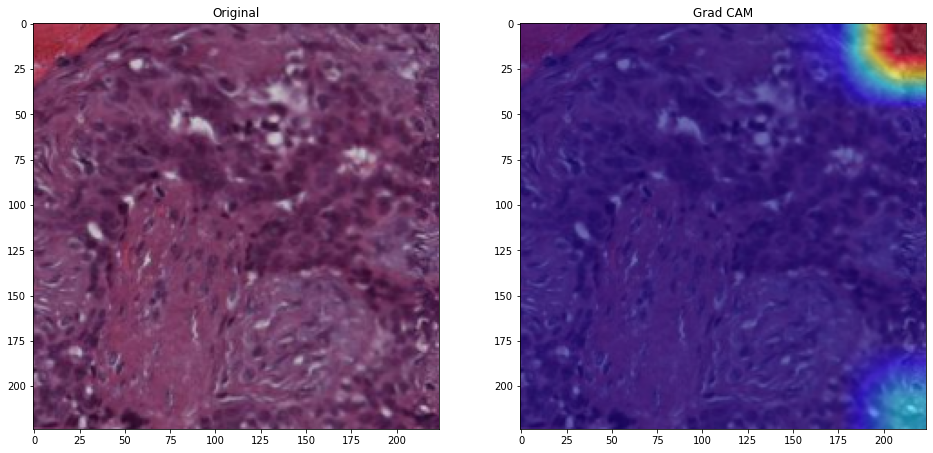

In [20]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Grad CAM')
_ = ax1.imshow(img)
_ = ax2.imshow(visualization)

## Grad cam + ViT

In [13]:
model.transformer.encoder.encoder_norm

LayerNorm((768,), eps=1e-06, elementwise_affine=True)

In [14]:
class GradCamDebug(GradCAM):
    
    def get_cam_weights(self,
                        input_tensor,
                        target_layer,
                        target_category,
                        activations,
                        grads):
        return np.mean(grads, axis=(2, 3))

In [15]:
def reshape_transform(tensor, height=14, width=14):
    result = tensor[:, :-1, :].reshape(tensor.size(0),
                                      height, width, tensor.size(2))

    # Bring the channels to the first dimension,
    # like in CNNs.
    result = result.transpose(2, 3).transpose(1, 2)
    return result

In [16]:
target_layers = [model.transformer.encoder.layer[-1]]

# target_layers = []
# for layer in [net.layer1, net.layer2, net.layer3,net.layer4]:
#     for i in range(3):
#         target_layers.append(layer[i])

# Construct the CAM object once, and then re-use it on many images:
cam = GradCamDebug(model=model, target_layers=target_layers, 
              reshape_transform=reshape_transform)

target_category = pred_label[0].item()

# You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)

# In this example grayscale_cam has only one image in the batch:
grayscale_cam = grayscale_cam[0, :]

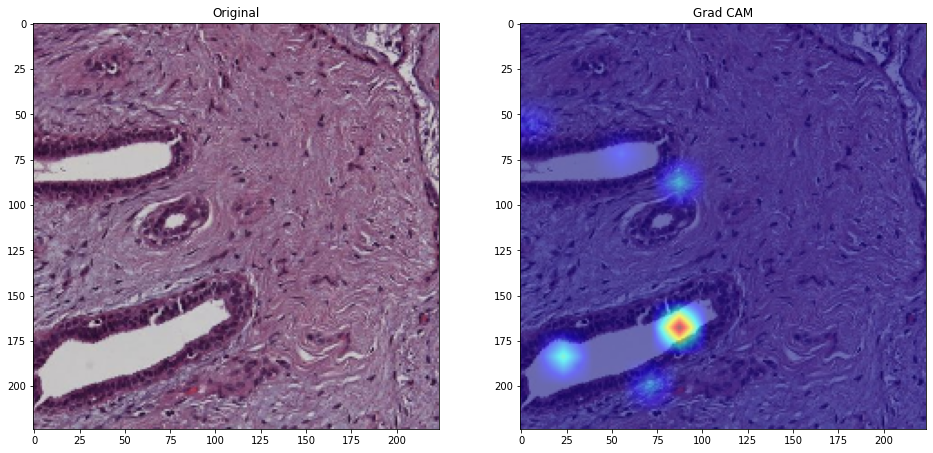

In [17]:
image = features.cpu().detach() / 255
image = image.squeeze().permute(1, 2, 0).numpy()
visualization = show_cam_on_image(image, grayscale_cam, use_rgb=True)
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Grad CAM')
_ = ax1.imshow(img)
_ = ax2.imshow(visualization)

In [41]:
y = reshape_transform(x.unsqueeze(0))

RuntimeError: shape '[1, 14, 14, 224]' is invalid for input of size 100352

In [29]:
from Sources.pytorch_grad_cam_master.pytorch_grad_cam.ablation_layer import AblationLayerVit

In [30]:
cam = GradCAM(model=model,
              target_layers=target_layers,
              reshape_transform=reshape_transform,
              ablation_layer=AblationLayerVit)

grayscale_cam = cam(input_tensor=x,
                    targets=None)

grayscale_cam = grayscale_cam[0, :]

image = features.cpu().detach() / 255
image = image.squeeze().permute(1, 2, 0).numpy()
visualization = show_cam_on_image(image, grayscale_cam, use_rgb=True)
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 16))

ax1.set_title('Original')
ax2.set_title('Grad CAM')
_ = ax1.imshow(img)
_ = ax2.imshow(visualization)

Exception ignored in: <function BaseCAM.__del__ at 0x7f1b95c85430>
Traceback (most recent call last):
  File "/home/anna/Desktop/Diploma/Learning/Sources/pytorch_grad_cam_master/pytorch_grad_cam/base_cam.py", line 197, in __del__
    self.activations_and_grads.release()
AttributeError: 'GradCAM' object has no attribute 'activations_and_grads'


TypeError: __init__() got an unexpected keyword argument 'ablation_layer'

## Generating maps

In [19]:
from torchvision.utils import save_image

val_dataloader = DataLoader(dataset, batch_size=1, shuffle=False)

img_number = 0
img_names = []

with open('../Maps/img_names.csv', 'w', newline="") as f:
    writer = csv.writer(f)    

    for data in tqdm_notebook(val_dataloader, desc='gettnig val maps'):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        
        # save img name + label
        label = labels[0].item()
        img_name = str(img_number) + '_' + str(label)
#         img_names.append(img_name)
        
        img = inputs[0].squeeze().permute(1, 2, 0).int()

        # ViT
        rollout = VITAttentionRollout(model, discard_ratio=0.9, head_fusion='max')
        mask = rollout(inputs)
        mask = cv2.resize(mask, (224, 224))[..., np.newaxis]
        result = (mask * inputs[0].permute(1, 2, 0).detach().numpy()).astype("uint8")
        
        # ResNet
        input_tensor = inputs.to(device)
        target_category = label
        # You can also pass aug_smooth=True and eigen_smooth=True, to apply smoothing.
        grayscale_cam = cam(input_tensor=input_tensor, target_category=target_category)
        # In this example grayscale_cam has only one image in the batch:
        grayscale_cam = grayscale_cam[0, :]
        image = inputs.cpu().detach() / 255
        image = image.squeeze().permute(1, 2, 0).numpy()
        visualization = show_cam_on_image(image, grayscale_cam, use_rgb=True)
        
        # saving
        cv2.imwrite(os.path.join('../Maps/Images', '{}.jpg'.format(img_name)), np.array(img))
        cv2.imwrite(os.path.join('../Maps/ResNet', '{}.jpg'.format(img_name)), np.array(result))
        cv2.imwrite(os.path.join('../Maps/ViT', '{}.jpg'.format(img_name)), np.array(visualization))
        
        img_number+= 1
        
        writer.writerow([img_name])
        
    

gettnig val maps:   0%|          | 0/10510 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [24]:
# with open('../Maps/img_names.csv', 'w', newline="") as f:
#     writer = csv.writer(f)
#     for item in img_names:
#         writer.writerow([item])

## Loading

In [3]:
def get_maps(img_name):
    img = Image.open(os.path.join('../Maps/Images/', str(img_name) + '.jpg'))
    resnet_map = Image.open(os.path.join('../Maps/ResNet/', str(img_name) + '.jpg'))
    vit_map = Image.open(os.path.join('../Maps/ViT/', str(img_name) + '.jpg'))
    
    fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 16))

    ax1.set_title('Original')
    ax2.set_title('ResNet + Grad CAM')
    ax3.set_title('ViT + rollout')
    _ = ax1.imshow(img)
    _ = ax2.imshow(resnet_map)
    _ = ax3.imshow(vit_map)

In [4]:
names = []

with open('../Maps/img_names.csv', 'r') as f:
    reader = csv.reader(f)
    for row in reader:
        names.append(row[0])

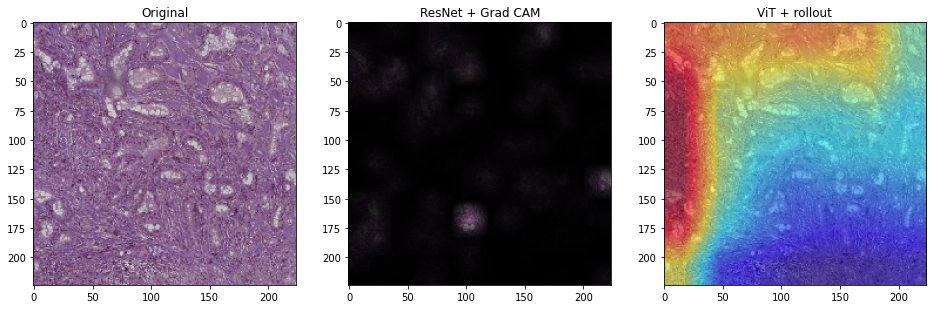

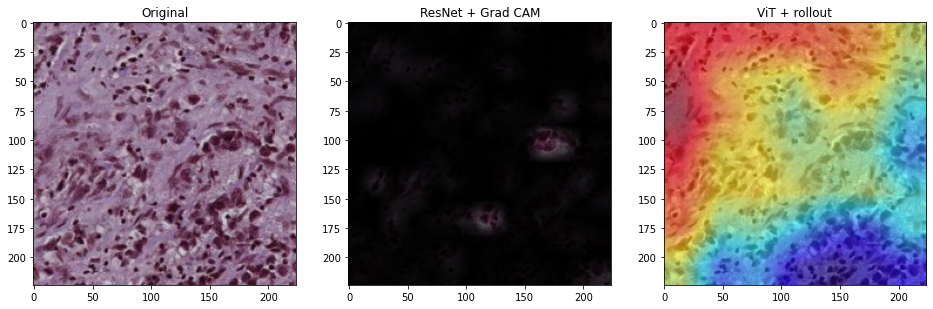

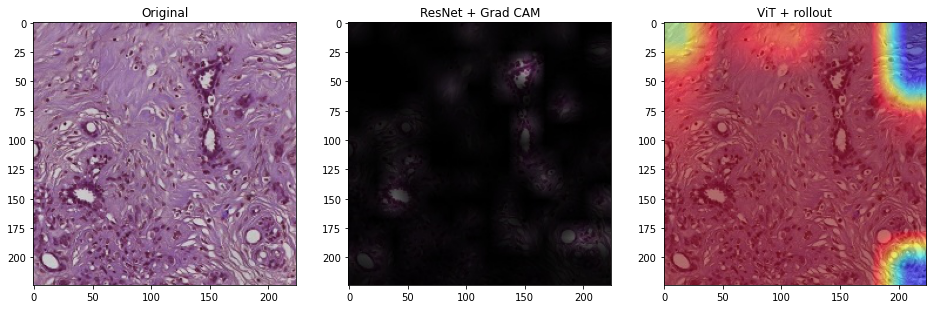

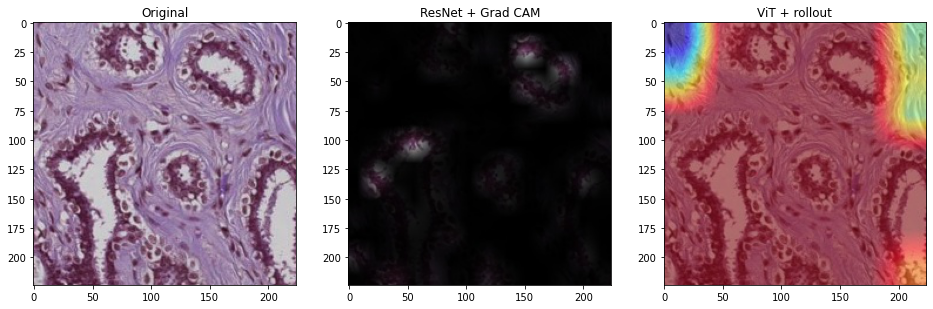

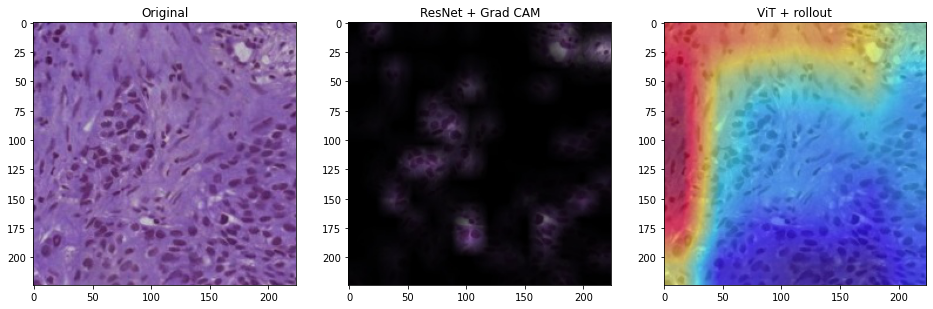

...

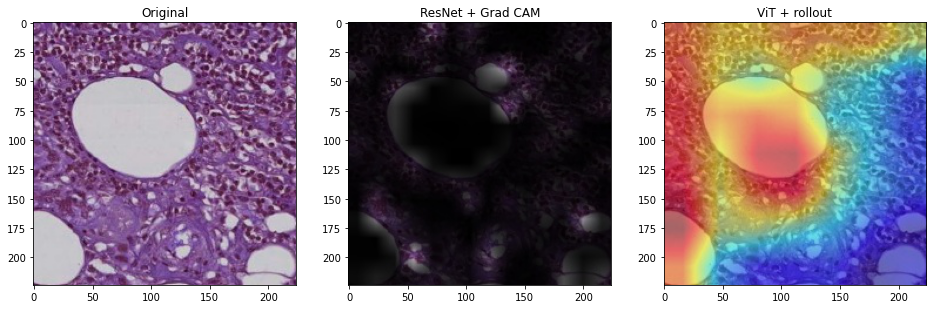

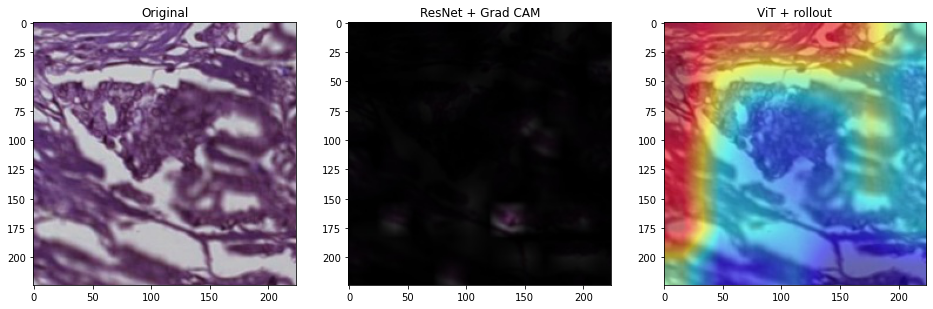

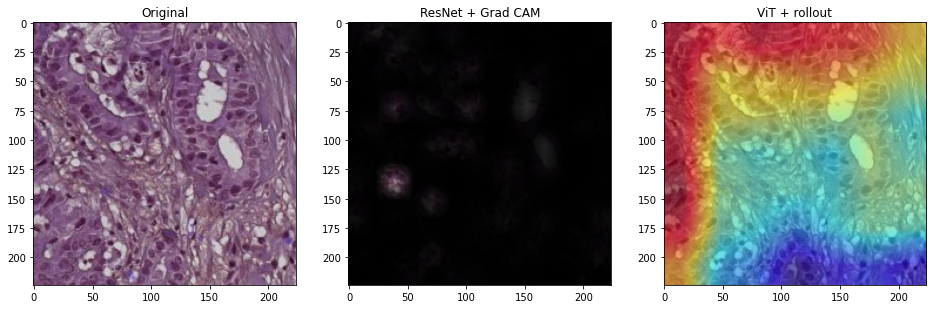

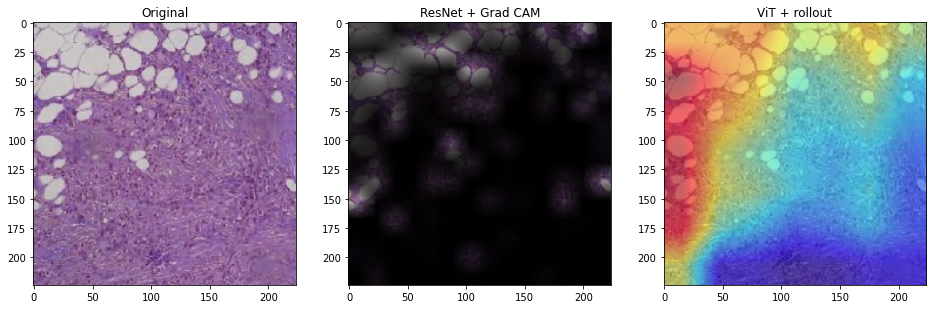

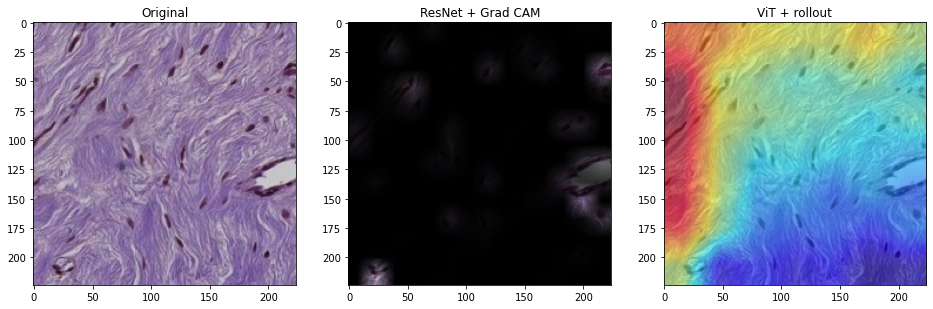

In [5]:
for i in range(20):
    get_maps(names[i])